In [66]:
from sklearn import datasets
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

In [67]:
olive=datasets.fetch_olivetti_faces()

In [68]:
olive.keys()


dict_keys(['data', 'images', 'target', 'DESCR'])

In [69]:
olive["data"].shape

(400, 4096)

In [70]:
olive["images"].shape

(400, 64, 64)

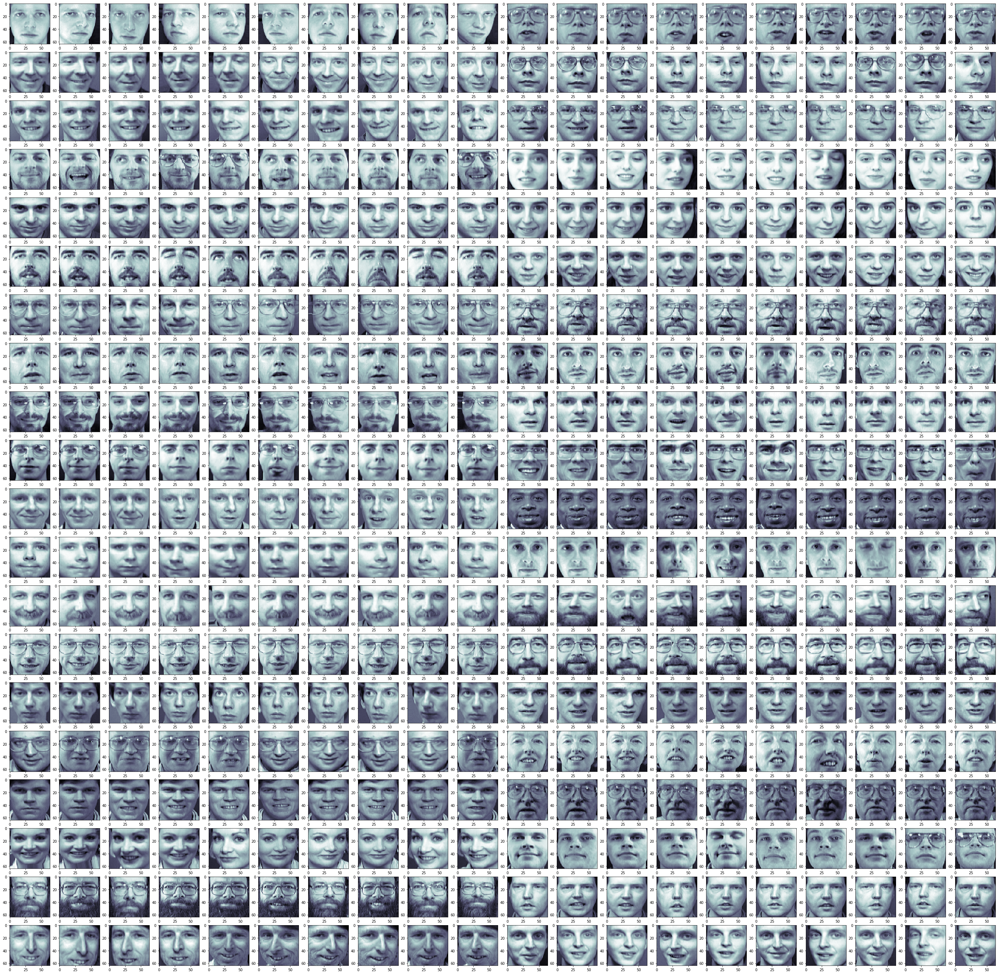

In [71]:
fig=plt.figure(figsize=(50,50)) ##### figure size in total 2d  
for i in range(400):
    ax=fig.add_subplot(20,20,i+1)
    ax.imshow(olive.images[i],cmap=plt.cm.bone)



# PCA REQUIRES THE DATA IN 2D ARRAY .SO WE WILL USE OLIVE.DATA NOW

In [72]:
x=olive.data
y=olive.target

# IN SKLEARN ,PCA() WILL TAKE MINIMUM OF DATA POINTS AND FEATURES FROM PICTURES AND IT THIS CASE DATAPOINTS ARE 400 WHICH ARE LESS THAN THAN NUMBER OF FEATURES OF THE IMAGES

In [73]:
pca=PCA()
pca.fit(x)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [74]:
pca.components_.shape
pca.explained_variance_.shape
print(pca.explained_variance_)

[1.88401699e+01 1.10717602e+01 6.30460739e+00 3.95458198e+00
 2.85604382e+00 2.49770427e+00 1.92006242e+00 1.61115861e+00
 1.54922068e+00 1.32295060e+00 1.26210916e+00 1.13690937e+00
 9.86397207e-01 9.07590091e-01 8.40928257e-01 7.73553669e-01
 7.27142870e-01 6.45265937e-01 5.96451283e-01 5.91000140e-01
 5.52701414e-01 4.86282170e-01 4.61992919e-01 4.50753927e-01
 4.32135910e-01 4.20793921e-01 4.06521797e-01 3.92300278e-01
 3.62095147e-01 3.49056095e-01 3.18056136e-01 3.03963691e-01
 2.86368847e-01 2.64683723e-01 2.53479183e-01 2.50045568e-01
 2.41426662e-01 2.36274123e-01 2.23224610e-01 2.16788799e-01
 2.05526710e-01 2.00952426e-01 1.93480775e-01 1.89756498e-01
 1.82676077e-01 1.79138437e-01 1.75868601e-01 1.74410135e-01
 1.65294260e-01 1.62178665e-01 1.55738413e-01 1.51460364e-01
 1.46404922e-01 1.41573101e-01 1.40520200e-01 1.36464939e-01
 1.33381188e-01 1.29886642e-01 1.28080651e-01 1.25318572e-01
 1.22971892e-01 1.20443732e-01 1.18643560e-01 1.16867021e-01
 1.12829395e-01 1.112380

In [90]:
k=0
total=sum(pca.explained_variance_)
currentSum=0
while currentSum/total < 0.99:
      currentSum+=pca.explained_variance_[k]
      k=k+1
k


204

In [ ]:
PUT WHITEN IS EUAL TO TRUE IN PCA FUNCTION

In [96]:
pca=PCA(n_components=k,whiten=True)
transformed_data=pca.fit_transform(x)
transformed_data.shape

(400, 204)

# for plottin the images we need the images in (400,64,65)

In [99]:
EIGENV=pca.components_
EIGENV.shape


(204, 4096)

In [102]:
EIGENFACES=EIGENV.reshape((204,64,64))

# EIGEN FACES ARE ACTUALLY DIFFENT PART OF THE FACES BY CHANCE .THIS IS THE IS THE MAGIC OF THE PCA AND THEY LOOK LIKE A IMAGES BESIDES OF THE PCA ANANLYSIS ON THEM

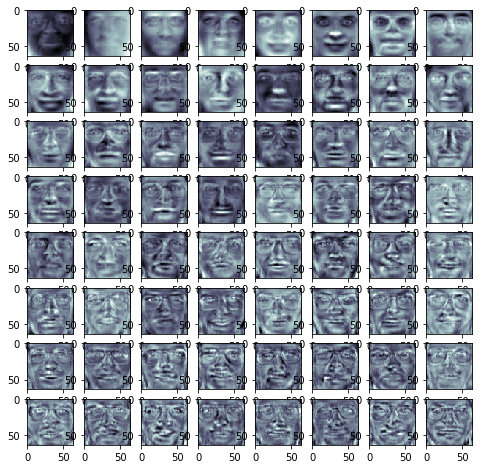

In [103]:
fig=plt.figure(figsize=(8,8)) ##### figure size in total 2d  
for i in range(64):
    ax=fig.add_subplot(8,8,i+1)
    ax.imshow(EIGENFACES[i],cmap=plt.cm.bone)
plt.show()

# REVERSING OUR PCA IN SKLEARN

In [88]:
inverse=pca.inverse_transform(transformed_data)
inverse=inverse.reshape((400,64,64))

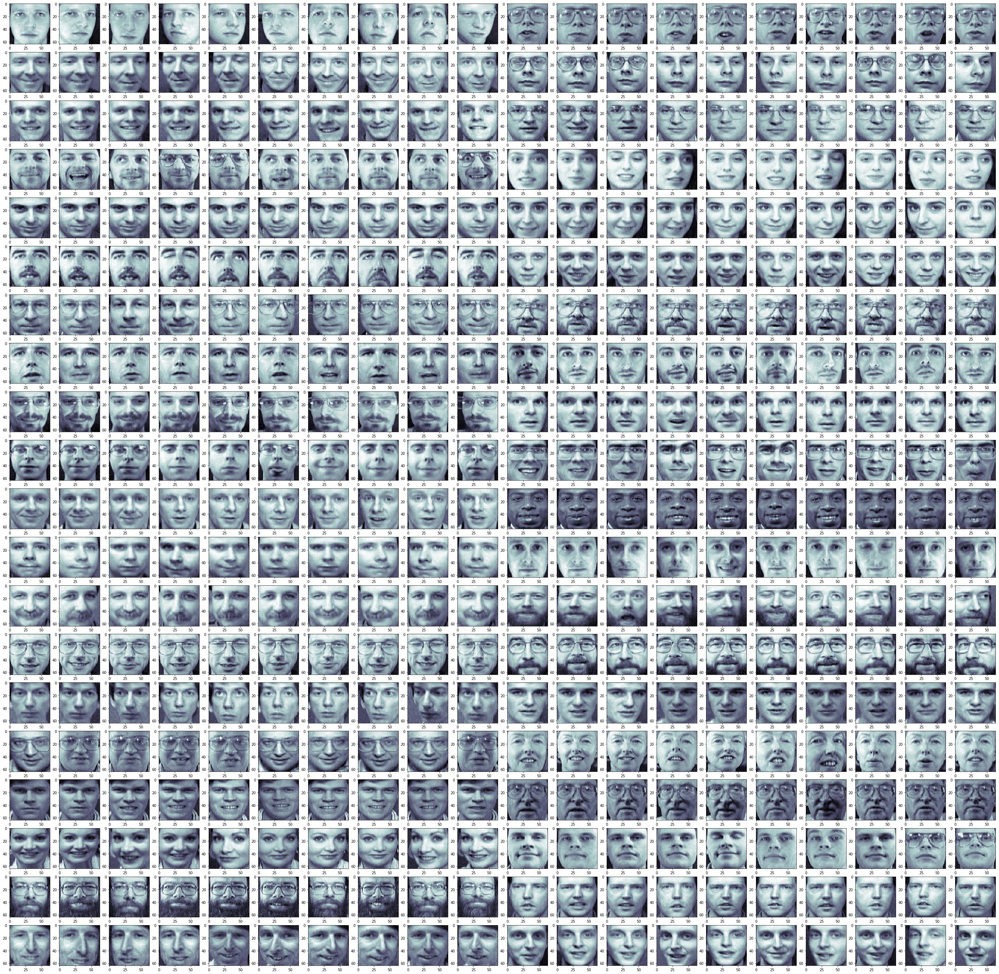

In [89]:
fig=plt.figure(figsize=(50,50)) ##### figure size in total 2d  
for i in range(400):
    ax=fig.add_subplot(20,20,i+1)
    ax.imshow(inverse[i],cmap=plt.cm.bone)